### Importing the required libraries 

In [96]:
import sys
print(sys.version)

3.11.5 (tags/v3.11.5:cce6ba9, Aug 24 2023, 14:38:34) [MSC v.1936 64 bit (AMD64)]


In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
%matplotlib inline

In [2]:
df = pd.read_csv("Rainfall.csv")
df.head(20)

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,ANDAMAN & NICOBAR ISLANDS,1901,5.425562,6.402735,6.479335,1.286539,1.823646,116.414660,195.805386,188.241033,165.023481,37.610254,24.073092,21.321837,687.8,129.2,45,1696.3,980.3
1,ANDAMAN & NICOBAR ISLANDS,1902,6.363432,6.736448,6.967879,1.531091,1.291864,190.546830,125.622613,142.753098,118.801573,29.915884,34.724058,25.587911,685.0,159.8,45,2185.9,716.7
2,ANDAMAN & NICOBAR ISLANDS,1903,6.360945,5.976305,6.296741,1.102800,1.044144,126.216327,124.511028,181.872851,155.580716,16.391010,15.027434,33.278399,697.7,156.7,45,1874.0,690.6
3,ANDAMAN & NICOBAR ISLANDS,1904,5.907111,5.511805,6.721339,1.122199,1.432005,139.137973,128.932171,169.875610,140.952898,31.822087,34.299520,38.698815,589.2,24.1,45,1977.6,571.0
4,ANDAMAN & NICOBAR ISLANDS,1905,6.997221,6.372104,6.525369,1.645742,1.660649,151.866710,147.044179,163.094756,130.491208,32.850206,31.930725,29.934982,551.7,1.3,45,1624.9,630.8
5,ANDAMAN & NICOBAR ISLANDS,1906,5.401834,6.676924,5.877542,1.339611,1.670127,160.223492,194.630992,208.144048,108.063166,38.861332,15.206190,27.748332,640.8,36.6,45,1465.8,475.9
6,ANDAMAN & NICOBAR ISLANDS,1907,5.802247,6.413644,5.759602,1.934055,1.283391,135.647906,147.966501,204.478682,165.944443,26.803678,35.242462,20.549956,685.0,110.7,45,1327.1,1158.9
7,ANDAMAN & NICOBAR ISLANDS,1908,6.166448,5.489200,5.664428,1.181891,1.487476,190.785396,173.401680,189.957639,156.663103,32.838152,24.759063,27.808015,705.9,106.0,45,2303.7,575.7
8,ANDAMAN & NICOBAR ISLANDS,1910,6.856578,6.718533,5.465909,1.504690,1.999032,124.119070,156.670733,182.748468,135.003744,15.640337,21.599191,38.781672,654.3,49.3,45,1701.0,629.0
9,ANDAMAN & NICOBAR ISLANDS,1911,5.245065,5.209048,6.192085,1.597870,1.153449,217.442759,105.926756,200.362132,211.107845,17.734054,26.833532,16.093183,613.4,8.4,45,1553.6,675.4


## Data Exploration and Pre-Processing

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4116 entries, 0 to 4115
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   SUBDIVISION  4116 non-null   object 
 1   YEAR         4116 non-null   int64  
 2   JAN          4116 non-null   float64
 3   FEB          4116 non-null   float64
 4   MAR          4116 non-null   float64
 5   APR          4116 non-null   float64
 6   MAY          4116 non-null   float64
 7   JUN          4116 non-null   float64
 8   JUL          4116 non-null   float64
 9   AUG          4116 non-null   float64
 10  SEP          4116 non-null   float64
 11  OCT          4116 non-null   float64
 12  NOV          4116 non-null   float64
 13  DEC          4116 non-null   float64
 14  ANNUAL       4116 non-null   float64
 15  Jan-Feb      4110 non-null   float64
 16  Mar-May      4116 non-null   int64  
 17  Jun-Sep      4106 non-null   float64
 18  Oct-Dec      4103 non-null   float64
dtypes: flo

In [4]:
df.describe()

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
count,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4110.000000,4116.000000,4106.000000,4103.000000
mean,1958.218659,5.992039,6.008085,6.017470,1.506005,1.496548,160.616592,159.533373,160.181852,159.271959,27.659141,27.508784,27.524882,489.178523,40.746058,44.952624,1064.724769,154.100487
std,33.140898,0.580512,0.575198,0.578264,0.290123,0.291527,34.501357,34.560797,34.604899,34.800996,7.230868,7.243859,7.130771,80.322269,59.305597,1.168206,707.741531,166.942660
min,1901.000000,5.000512,5.000149,5.000016,1.000101,1.000037,100.006212,100.037980,100.045708,100.002309,15.004360,15.007164,15.027467,46.600000,0.000000,0.000000,57.400000,0.000000
25%,1930.000000,5.495221,5.510964,5.516727,1.253700,1.243742,130.681610,128.919107,130.808167,129.177105,21.466873,21.274227,21.353183,427.800000,4.100000,45.000000,573.850000,34.200000
50%,1958.000000,5.992968,6.013788,6.029354,1.510499,1.493196,161.009707,159.640628,158.147627,159.227656,27.730682,27.585348,27.496501,478.600000,19.200000,45.000000,881.100000,98.200000
75%,1987.000000,6.486413,6.505382,6.515695,1.753530,1.749840,190.638833,189.215164,190.506944,189.445544,34.047050,33.792005,33.672426,539.925000,50.375000,45.000000,1288.175000,213.500000
max,2015.000000,6.999778,6.999659,6.999639,1.999486,1.999886,219.999925,219.992993,219.995348,219.682724,39.992227,39.998294,39.987295,765.000000,699.500000,45.000000,4536.900000,1252.500000


In [5]:
df.isnull().sum()

SUBDIVISION     0
YEAR            0
JAN             0
FEB             0
MAR             0
APR             0
MAY             0
JUN             0
JUL             0
AUG             0
SEP             0
OCT             0
NOV             0
DEC             0
ANNUAL          0
Jan-Feb         6
Mar-May         0
Jun-Sep        10
Oct-Dec        13
dtype: int64

In [6]:
df.duplicated().sum()

0

In [7]:
df['SUBDIVISION'].value_counts()

SUBDIVISION
WEST MADHYA PRADESH                   115
EAST RAJASTHAN                        115
COASTAL KARNATAKA                     115
TAMIL NADU                            115
RAYALSEEMA                            115
TELANGANA                             115
COASTAL ANDHRA PRADESH                115
CHHATTISGARH                          115
VIDARBHA                              115
MATATHWADA                            115
MADHYA MAHARASHTRA                    115
KONKAN & GOA                          115
SAURASHTRA & KUTCH                    115
GUJARAT REGION                        115
EAST MADHYA PRADESH                   115
KERALA                                115
WEST RAJASTHAN                        115
SOUTH INTERIOR KARNATAKA              115
JAMMU & KASHMIR                       115
HIMACHAL PRADESH                      115
PUNJAB                                115
HARYANA DELHI & CHANDIGARH            115
UTTARAKHAND                           115
WEST UTTAR PRADESH    

In [8]:
df.mean(numeric_only=True)

YEAR       1958.218659
JAN           5.992039
FEB           6.008085
MAR           6.017470
APR           1.506005
MAY           1.496548
JUN         160.616592
JUL         159.533373
AUG         160.181852
SEP         159.271959
OCT          27.659141
NOV          27.508784
DEC          27.524882
ANNUAL      489.178523
Jan-Feb      40.746058
Mar-May      44.952624
Jun-Sep    1064.724769
Oct-Dec     154.100487
dtype: float64

In [9]:
# filling na values with mean
df = df.fillna(df.mean(numeric_only=True))

In [10]:
df.head(25)

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,ANDAMAN & NICOBAR ISLANDS,1901,5.425562,6.402735,6.479335,1.286539,1.823646,116.414660,195.805386,188.241033,165.023481,37.610254,24.073092,21.321837,687.8,129.2,45,1696.3,980.300000
1,ANDAMAN & NICOBAR ISLANDS,1902,6.363432,6.736448,6.967879,1.531091,1.291864,190.546830,125.622613,142.753098,118.801573,29.915884,34.724058,25.587911,685.0,159.8,45,2185.9,716.700000
2,ANDAMAN & NICOBAR ISLANDS,1903,6.360945,5.976305,6.296741,1.102800,1.044144,126.216327,124.511028,181.872851,155.580716,16.391010,15.027434,33.278399,697.7,156.7,45,1874.0,690.600000
3,ANDAMAN & NICOBAR ISLANDS,1904,5.907111,5.511805,6.721339,1.122199,1.432005,139.137973,128.932171,169.875610,140.952898,31.822087,34.299520,38.698815,589.2,24.1,45,1977.6,571.000000
4,ANDAMAN & NICOBAR ISLANDS,1905,6.997221,6.372104,6.525369,1.645742,1.660649,151.866710,147.044179,163.094756,130.491208,32.850206,31.930725,29.934982,551.7,1.3,45,1624.9,630.800000
5,ANDAMAN & NICOBAR ISLANDS,1906,5.401834,6.676924,5.877542,1.339611,1.670127,160.223492,194.630992,208.144048,108.063166,38.861332,15.206190,27.748332,640.8,36.6,45,1465.8,475.900000
6,ANDAMAN & NICOBAR ISLANDS,1907,5.802247,6.413644,5.759602,1.934055,1.283391,135.647906,147.966501,204.478682,165.944443,26.803678,35.242462,20.549956,685.0,110.7,45,1327.1,1158.900000
7,ANDAMAN & NICOBAR ISLANDS,1908,6.166448,5.489200,5.664428,1.181891,1.487476,190.785396,173.401680,189.957639,156.663103,32.838152,24.759063,27.808015,705.9,106.0,45,2303.7,575.700000
8,ANDAMAN & NICOBAR ISLANDS,1910,6.856578,6.718533,5.465909,1.504690,1.999032,124.119070,156.670733,182.748468,135.003744,15.640337,21.599191,38.781672,654.3,49.3,45,1701.0,629.000000
9,ANDAMAN & NICOBAR ISLANDS,1911,5.245065,5.209048,6.192085,1.597870,1.153449,217.442759,105.926756,200.362132,211.107845,17.734054,26.833532,16.093183,613.4,8.4,45,1553.6,675.400000


In [11]:
df.isnull().any()

SUBDIVISION    False
YEAR           False
JAN            False
FEB            False
MAR            False
APR            False
MAY            False
JUN            False
JUL            False
AUG            False
SEP            False
OCT            False
NOV            False
DEC            False
ANNUAL         False
Jan-Feb        False
Mar-May        False
Jun-Sep        False
Oct-Dec        False
dtype: bool

In [12]:
df.YEAR.unique()

array([1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1910, 1911, 1912,
       1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923,
       1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934,
       1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1946, 1947, 1949,
       1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960,
       1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015,
       1943, 1944, 1945, 1948, 1909], dtype=int64)

In [13]:
df.shape

(4116, 19)

## Data Visualization

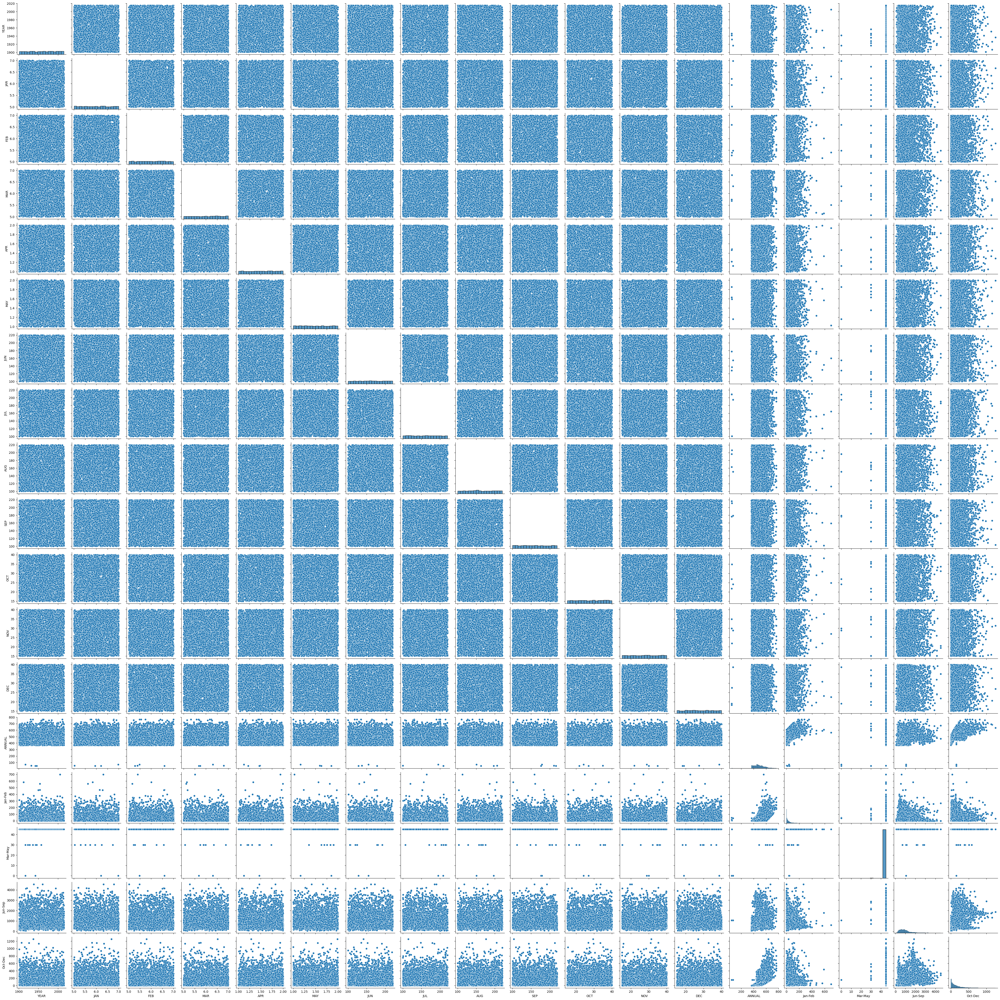

In [14]:
sns.pairplot(df)

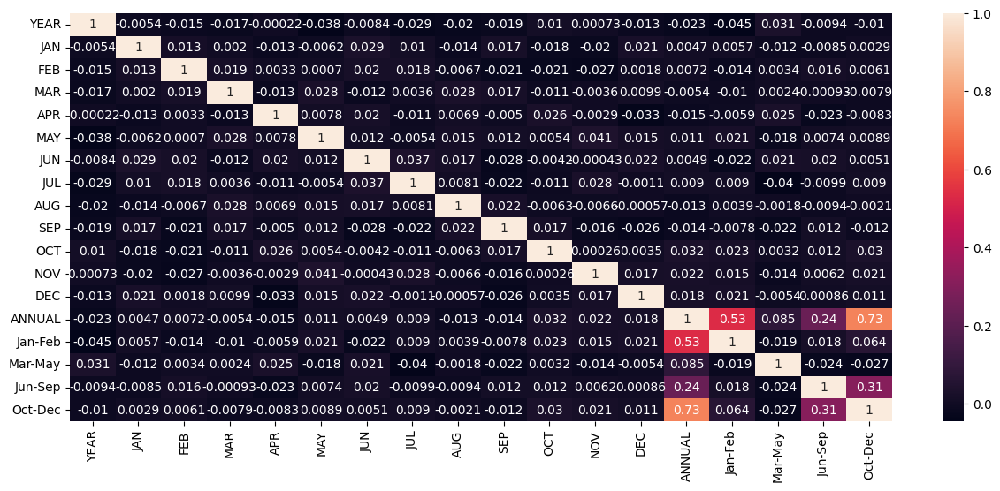

In [15]:
# plt.figure(figsize=(15,6))
# sns.heatmap(df.corr(),annot=True)
# plt.show()
plt.figure(figsize=(15,6))
numeric_df = df.select_dtypes(include=[np.number])
sns.heatmap(numeric_df.corr(), annot=True)
plt.show()

`The above heatmap shows the coorelation between different features in the dataset`

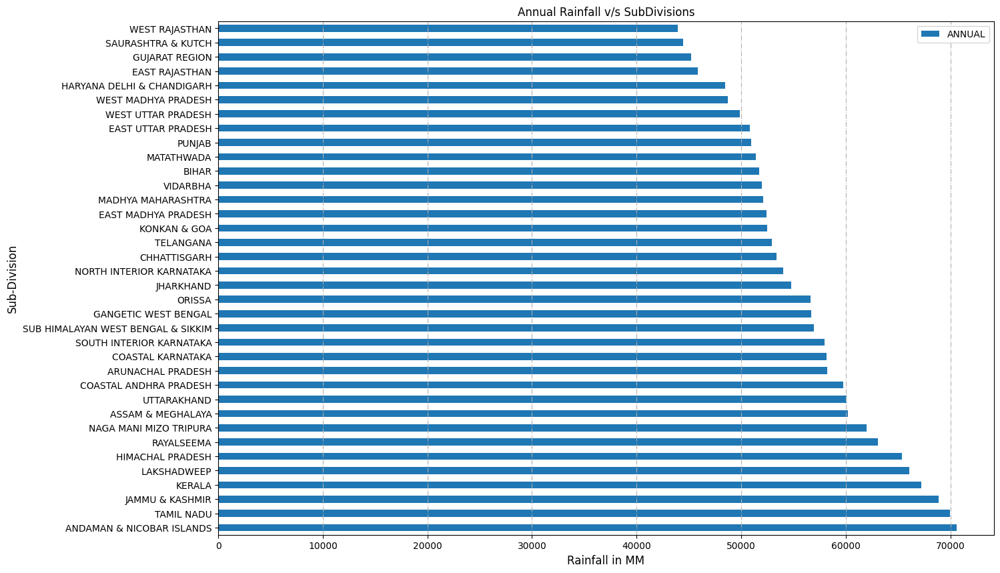

In [16]:
df[["SUBDIVISION","ANNUAL"]].groupby("SUBDIVISION").sum().sort_values(by='ANNUAL',ascending=False).plot(kind='barh',stacked=True,figsize=(15,10))
plt.xlabel("Rainfall in MM",size=12)
plt.ylabel("Sub-Division",size=12)
plt.title("Annual Rainfall v/s SubDivisions")
plt.grid(axis="x",linestyle="-.")
plt.show()

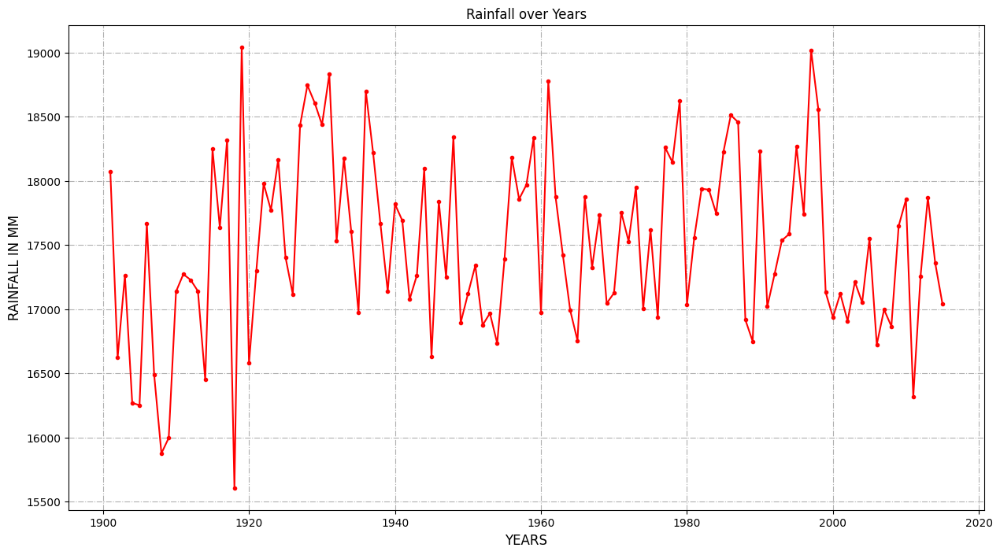

In [17]:
plt.figure(figsize=(15,8))
df.groupby("YEAR").sum()['ANNUAL'].plot(kind="line",color="r",marker=".")
plt.xlabel("YEARS",size=12)
plt.ylabel("RAINFALL IN MM",size=12)
plt.grid(axis="both",linestyle="-.")
plt.title("Rainfall over Years")
plt.show()

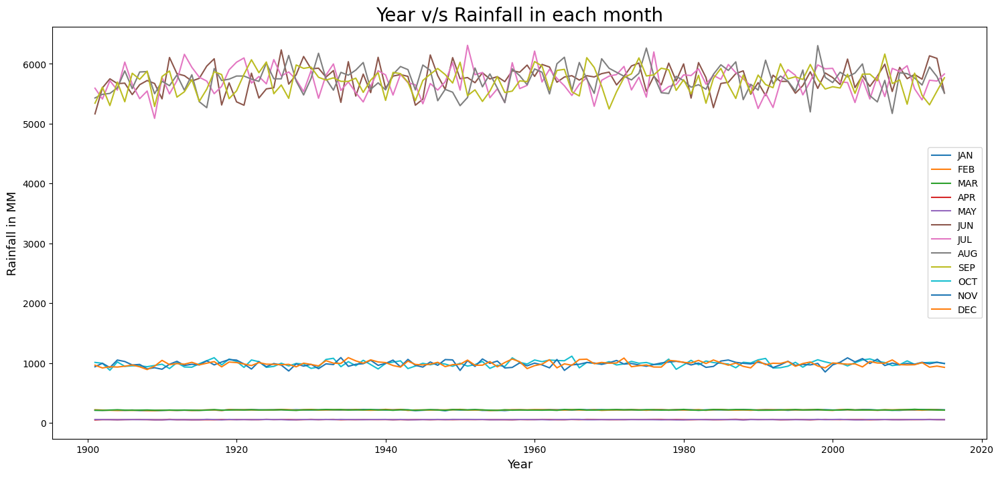

In [18]:
df[['YEAR', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL','AUG', 'SEP',
      'OCT', 'NOV', 'DEC']].groupby("YEAR").sum().plot(kind="line",figsize=(18,8))
plt.xlabel("Year",size=13)
plt.ylabel("Rainfall in MM",size=13)
plt.title("Year v/s Rainfall in each month",size=20)
plt.show()

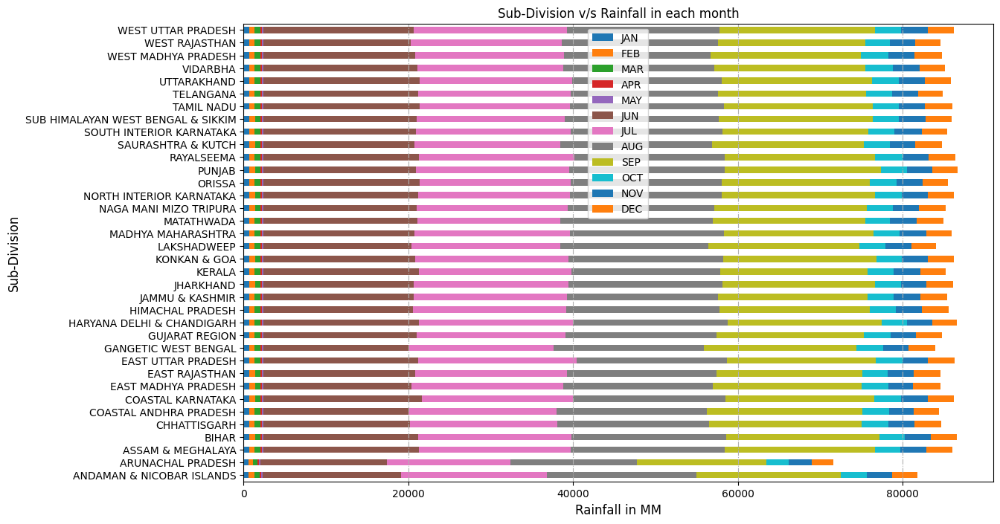

In [19]:
df[['SUBDIVISION', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].groupby("SUBDIVISION").sum().plot(kind="barh",stacked=True,figsize=(13,8))
plt.title("Sub-Division v/s Rainfall in each month")
plt.xlabel("Rainfall in MM",size=12)
plt.ylabel("Sub-Division",size=12)
plt.grid(axis="x",linestyle="-.")
plt.show()

### Analysis of rainfall data 

In [20]:
V = df.loc[((df['SUBDIVISION'] == 'VIDARBHA'))]
V.head(5)

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
2852,VIDARBHA,1901,5.088256,5.477558,5.518502,1.386857,1.714505,114.292072,209.381714,216.151222,103.700057,39.853486,37.783604,30.696672,476.9,76.6,45,917.2,35.2
2853,VIDARBHA,1902,6.712560,6.291354,6.053941,1.137420,1.754203,132.687410,126.436024,100.207788,101.867416,33.198404,32.397331,20.077673,439.1,1.7,45,664.3,72.4
2854,VIDARBHA,1903,6.966206,5.789053,5.040277,1.598767,1.748499,203.723357,189.111674,147.812348,166.001429,38.996365,22.917333,39.888938,456.2,9.3,45,1077.0,102.8
2855,VIDARBHA,1904,5.537388,6.064245,6.726722,1.598532,1.455929,104.403245,143.245716,113.655602,214.710411,29.275064,38.002941,31.611189,434.3,6.7,45,655.9,62.7
2856,VIDARBHA,1905,5.707105,5.890990,6.234978,1.440370,1.432914,105.239081,210.458191,199.198267,174.255835,20.330283,32.791935,18.601577,391.2,20.0,45,873.1,6.2


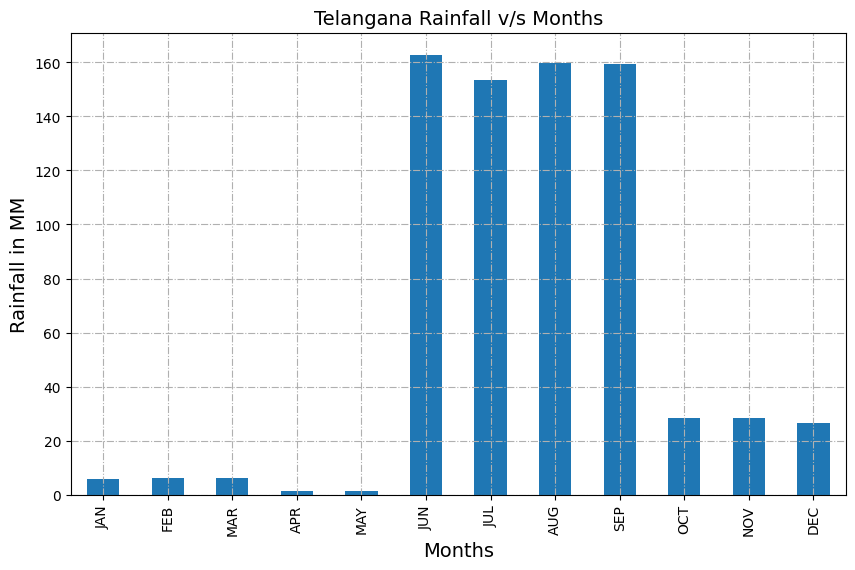

In [21]:
plt.figure(figsize=(10,6))
V[['JAN', 'FEB', 'MAR', 'APR','MAY', 'JUN','JUL','AUG', 'SEP', 'OCT','NOV','DEC']].mean().plot(kind="bar",width=0.5,linewidth=2)
plt.title("Telangana Rainfall v/s Months",size=14)
plt.xlabel("Months",size=14)
plt.ylabel("Rainfall in MM",size=14)
plt.grid(axis="both",linestyle="-.")
plt.show()

`From the above graph we observe that:-
 1)Telangana has good amount of rainfall in JUL and AUG`

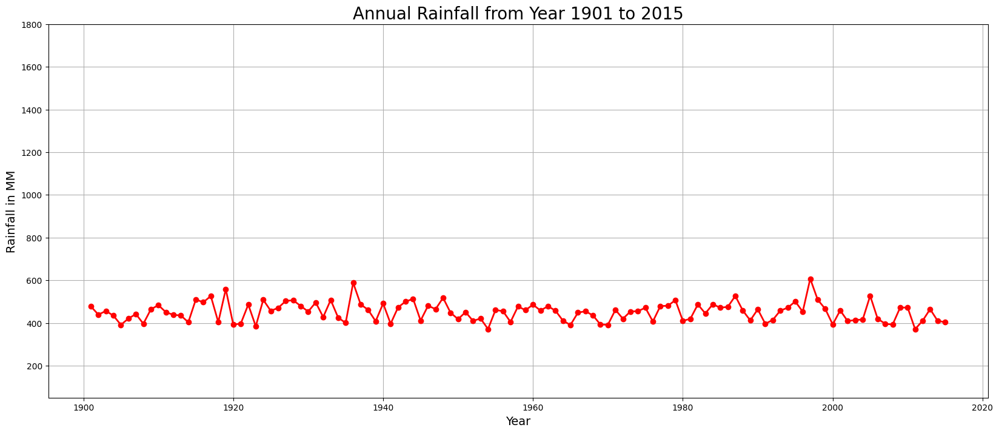

In [22]:
V.groupby("YEAR").sum()['ANNUAL'].plot(ylim=(50,1800),color='r',marker='o',linestyle='-',linewidth=2,figsize=(20,8));
plt.xlabel('Year',size=14)
plt.ylabel('Rainfall in MM',size=14)
plt.title('Annual Rainfall from Year 1901 to 2015',size=20)
plt.grid()
plt.show()

`From the Above graph we observe that:-
(1)The lowest rainfall in Telangana was noted in 1920
(2)and, The highest Rainfall was noted in 1958`

## Modelling

In [23]:
df["SUBDIVISION"].nunique()

36

In [24]:
group = df.groupby('SUBDIVISION')[['YEAR','JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']]
df = group.get_group('TELANGANA')
df.head()

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
3197,1901,5.283571,6.462150,6.007340,1.040313,1.713681,139.072967,188.158361,191.781600,126.852175,37.212156,21.362645,35.561105
3198,1902,5.398074,5.995381,6.810253,1.266028,1.939968,175.776236,195.597325,157.932475,122.332006,22.206524,30.776150,25.840197
3199,1903,6.281391,6.564693,5.499916,1.894416,1.177613,195.968308,191.616678,123.602061,148.020894,15.966064,31.378903,20.558310
3200,1904,6.955051,6.637241,6.741429,1.878716,1.343368,120.669744,109.933470,174.361793,202.875141,27.046124,36.524597,35.684822
3201,1905,5.848838,5.853992,6.024808,1.603356,1.683576,102.690740,165.914399,127.039277,208.778334,27.585951,39.026389,23.549905


In [25]:
df2=df.melt(['YEAR']).reset_index()
df2.head()

,index,YEAR,variable,value
0,0,1901,JAN,5.283571
1,1,1902,JAN,5.398074
2,2,1903,JAN,6.281391
3,3,1904,JAN,6.955051
4,4,1905,JAN,5.848838


In [26]:
df2= df2[['YEAR','variable','value']].reset_index().sort_values(by=['YEAR','index'])
df2.head()

,index,YEAR,variable,value
0,0,1901,JAN,5.283571
115,115,1901,FEB,6.462150
230,230,1901,MAR,6.007340
345,345,1901,APR,1.040313
460,460,1901,MAY,1.713681


In [27]:
df2.YEAR.unique()

array([1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910, 1911,
       1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922,
       1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933,
       1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944,
       1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955,
       1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966,
       1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977,
       1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988,
       1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
       2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015], dtype=int64)

In [28]:
df2.columns=['Index','Year','Month','Avg_Rainfall']

In [29]:
df2.head()

,Index,Year,Month,Avg_Rainfall
0,0,1901,JAN,5.283571
115,115,1901,FEB,6.462150
230,230,1901,MAR,6.007340
345,345,1901,APR,1.040313
460,460,1901,MAY,1.713681


In [30]:
Month_map={'JAN':1,'FEB':2,'MAR' :3,'APR':4,'MAY':5,'JUN':6,'JUL':7,'AUG':8,'SEP':9,
   'OCT':10,'NOV':11,'DEC':12}
df2['Month']=df2['Month'].map(Month_map)
df2.head(12)

,Index,Year,Month,Avg_Rainfall
0,0,1901,1,5.283571
115,115,1901,2,6.462150
230,230,1901,3,6.007340
345,345,1901,4,1.040313
460,460,1901,5,1.713681
575,575,1901,6,139.072967
690,690,1901,7,188.158361
805,805,1901,8,191.781600
920,920,1901,9,126.852175
1035,1035,1901,10,37.212156


In [31]:
df2.drop(columns="Index",inplace=True)

In [32]:
df2.head(2)

,Year,Month,Avg_Rainfall
0,1901,1,5.283571
115,1901,2,6.462150


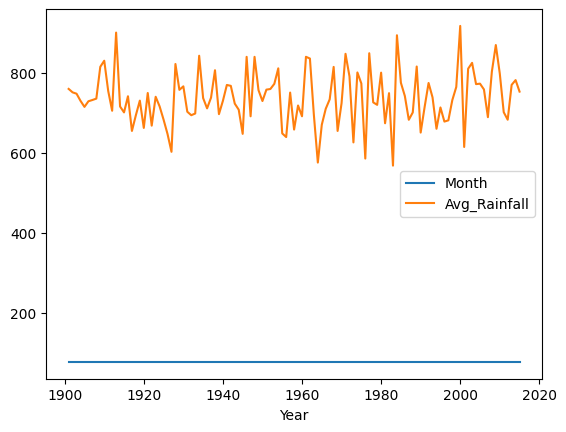

In [33]:
df2.groupby("Year").sum().plot()
plt.show()

In [34]:
X=np.asanyarray(df2[['Year','Month']]).astype('int')
y=np.asanyarray(df2['Avg_Rainfall']).astype('int')

In [35]:
X

array([[1901,    1],
       [1901,    2],
       [1901,    3],
       ...,
       [2015,   10],
       [2015,   11],
       [2015,   12]])

In [36]:
X[:15]

array([[1901,    1],
       [1901,    2],
       [1901,    3],
       [1901,    4],
       [1901,    5],
       [1901,    6],
       [1901,    7],
       [1901,    8],
       [1901,    9],
       [1901,   10],
       [1901,   11],
       [1901,   12],
       [1902,    1],
       [1902,    2],
       [1902,    3]])

In [37]:
y

array([ 5,  6,  6, ..., 23, 39, 23])

In [38]:
print(X.shape)
print(y.shape)

(1380, 2)
(1380,)


In [39]:
# splitting the dataset into training and testing
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [40]:
X_train

array([[1959,    4],
       [1986,   10],
       [1993,    4],
       ...,
       [1944,   12],
       [1996,   10],
       [2008,    6]])

In [41]:
y_train

array([  1,  26,   1, ...,  31,  21, 208])

### ❏ Linear Regression Model

In [42]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(X_train,y_train)

LinearRegression()

In [43]:
# predicting 
y_train_predict=LR.predict(X_train)
y_test_predict=LR.predict(X_test)

In [44]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))
print('Explained Variance Score:', metrics.explained_variance_score(y_test, y_test_predict),2)

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

print("\n-----Training Accuracy-------")
print(round(LR.score(X_train,y_train),3)*100)
print("-----Testing Accuracy--------")
print(round(LR.score(X_test,y_test),3)*100)

-------Test Data--------
MAE: 64.5934893042159
MSE: 5298.553643809189
RMSE: 72.79116459989625
Explained Variance Score: 0.08484732115913896 2

-------Train Data--------
MAE: 59.20245405925802
MSE: 4649.164422512577
RMSE: 68.18478145827393

-----Training Accuracy-------
9.0
-----Testing Accuracy--------
6.9


In [45]:
predicted = LR.predict([[2014,2]])

In [46]:
predicted

array([31.89053762])

### ❏ Random Forest Model

In [47]:
from sklearn.ensemble import RandomForestRegressor
random_forest_model = RandomForestRegressor(max_depth=100, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, n_estimators=800)
random_forest_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=100, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, n_estimators=800)

In [48]:
y_train_predict=random_forest_model.predict(X_train)
y_test_predict=random_forest_model.predict(X_test)

In [49]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 13.66859333837434
MSE: 509.4040483744958
RMSE: 22.569981133676116

-------Train Data--------
MAE: 9.734112849696048
MSE: 288.6777814044459
RMSE: 16.99052033942592


In [50]:
print("-----------Training Accuracy------------")
print(round(random_forest_model.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(random_forest_model.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
94.39999999999999
-----------Testing Accuracy------------
91.0


In [51]:
predicted = random_forest_model.predict([[2014,2]])

In [52]:
predicted

array([7.34498385])

In [53]:
predicted = random_forest_model.predict([[2001,3]])

In [54]:
predicted

array([5.60772479])

### ❏ SVM

In [55]:
from sklearn import svm
svm_regr = svm.SVC(kernel='rbf')
svm_regr.fit(X_train, y_train)

SVC()

In [56]:
y_train_predict=svm_regr.predict(X_train)
y_test_predict=svm_regr.predict(X_test)

In [57]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 69.22101449275362
MSE: 10480.93115942029
RMSE: 102.37641896169396

-------Train Data--------
MAE: 57.71195652173913
MSE: 8440.15579710145
RMSE: 91.87032054532872


In [58]:
print("-----------Training Accuracy------------")
print(round(svm_regr.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(svm_regr.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
16.3
-----------Testing Accuracy------------
18.099999999999998


### ❏ Logistic Regression

In [59]:
from sklearn.linear_model import LogisticRegression
# logreg = LogisticRegression(random_state=0,solver='lbfgs',class_weight='balanced', max_iter=10000)
logreg = LogisticRegression(random_state=0,solver='lbfgs')
logreg.fit(X_train,y_train)

c:\Users\shanthikumar\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [60]:
y_train_predict=logreg.predict(X_train)
y_test_predict=logreg.predict(X_test)

In [61]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 41.2463768115942
MSE: 4900.753623188406
RMSE: 70.00538281581214

-------Train Data--------
MAE: 35.67934782608695
MSE: 4440.090579710145
RMSE: 66.63400468011918


In [62]:
print("-----------Training Accuracy------------")
print(round(logreg.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(logreg.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
30.9
-----------Testing Accuracy------------
30.4


In [63]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [64]:
pip install --upgrade xgboost

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### ❏ xgboost

In [65]:
from xgboost import XGBRegressor
xgb = XGBRegressor()
xgb.fit(X_train, y_train)
#xgb = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5)
#xgb.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [66]:
y_train_predict=xgb.predict(X_train)
y_test_predict=xgb.predict(X_test)

In [67]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 16.414884201480426
MSE: 727.1571899946491
RMSE: 26.965852294979463

-------Train Data--------
MAE: 3.9331281505241664
MSE: 48.34399872293694
RMSE: 6.9529848786644814


In [68]:
print("-----------Training Accuracy------------")
print(round(xgb.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(xgb.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
99.1
-----------Testing Accuracy------------
87.2


### ❏ Gradient Boosting Regressor

In [69]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor(random_state=0)
gbr.fit(X_train, y_train)

GradientBoostingRegressor(random_state=0)

In [70]:
y_train_predict=gbr.predict(X_train)
y_test_predict=gbr.predict(X_test)

In [71]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 13.15309287043325
MSE: 468.63494410734467
RMSE: 21.647977829518965

-------Train Data--------
MAE: 10.849201177919694
MSE: 341.28904255682704
RMSE: 18.47400992088147


In [72]:
print("-----------Training Accuracy------------")
print(round(gbr.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(gbr.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
93.30000000000001
-----------Testing Accuracy------------
91.8


### ❏ Hybrid Model 1

The stacked model with meta learner = xgboost and the weak learners = Linear Regression, Random Forest and SVM

In [73]:
from mlxtend.regressor import StackingCVRegressor

In [74]:
pip install mlxtend


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [75]:
stack = StackingCVRegressor(regressors=(LR, random_forest_model, svm_regr),
                            meta_regressor=xgb, cv=12,
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,
                            random_state=42)

stack.fit(X_train, y_train)

StackingCVRegressor(cv=12,
                    meta_regressor=XGBRegressor(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytree=None,
                                                device=None,
                                                early_stopping_rounds=None,
                                                enable_categorical=False,
                                                eval_metric=None,
                                                feature_types=None,
                                                feature_weights=None,
                                                gamma=None, grow_policy=None,
                                                importance_type=None,
                                                interaction_con...
                                                missing=nan,
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=None, n_jobs=None,
                                                num_parallel_tree=None, ...),
                    random_state=42,
                    regressors=(LinearRegression(),
                                RandomForestRegressor(max_depth=100,
                                                      max_features='sqrt',
                                                      min_samples_leaf=4,
                                                      min_samples_split=10,
                                                      n_estimators=800),
                                SVC()),
                    shuffle=False, store_train_meta_features=True,
                    use_features_in_secondary=True)

In [76]:
y_train_predict=stack.predict(X_train)
y_test_predict=stack.predict(X_test)

In [77]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 13.88567930503168
MSE: 584.4546882681565
RMSE: 24.175497683980705

-------Train Data--------
MAE: 11.19078831990128
MSE: 461.97124981007715
RMSE: 21.49351645985545


In [78]:
print("-----------Training Accuracy------------")
print(round(stack.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(stack.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
91.0
-----------Testing Accuracy------------
89.7


The stacked model with meta learner = Linear Regression and the weak learners = Linear Regression, Random Forest and SVM 

In [79]:
stack2 = StackingCVRegressor(regressors=(LR, random_forest_model,svm_regr),
                            meta_regressor=LR, cv=12,
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,
                            random_state=42)

stack2.fit(X_train, y_train)

StackingCVRegressor(cv=12, meta_regressor=LinearRegression(), random_state=42,
                    regressors=(LinearRegression(),
                                RandomForestRegressor(max_depth=100,
                                                      max_features='sqrt',
                                                      min_samples_leaf=4,
                                                      min_samples_split=10,
                                                      n_estimators=800),
                                SVC()),
                    shuffle=False, store_train_meta_features=True,
                    use_features_in_secondary=True)

In [80]:
y_train_predict=stack2.predict(X_train)
y_test_predict=stack2.predict(X_test)

In [81]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 13.639995115746888
MSE: 514.9847104031365
RMSE: 22.69327456325192

-------Train Data--------
MAE: 9.622766928993974
MSE: 280.6224554110277
RMSE: 16.751789618158046


In [82]:
print("-----------Training Accuracy------------")
print(round(stack2.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(stack2.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
94.5
-----------Testing Accuracy------------
90.9


In [83]:
from sklearn.metrics import r2_score

In [84]:
score = r2_score(y_test, y_test_predict)

In [85]:
score

0.9094831948073445

The stacked model with meta learner = Logistic Regression and the weak learners = Linear Regression, Random Forest and SVM 

In [86]:
stack3 = StackingCVRegressor(regressors=(LR, random_forest_model,logreg),
                            meta_regressor=LR, cv=12,
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,
                            random_state=42)

stack3.fit(X_train, y_train)

c:\Users\shanthikumar\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\shanthikumar\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

StackingCVRegressor(cv=12, meta_regressor=LinearRegression(), random_state=42,
                    regressors=(LinearRegression(),
                                RandomForestRegressor(max_depth=100,
                                                      max_features='sqrt',
                                                      min_samples_leaf=4,
                                                      min_samples_split=10,
                                                      n_estimators=800),
                                LogisticRegression(random_state=0)),
                    shuffle=False, store_train_meta_features=True,
                    use_features_in_secondary=True)

In [87]:
y_train_predict=stack3.predict(X_train)
y_test_predict=stack3.predict(X_test)

In [88]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 13.541931047237405
MSE: 508.20578519462015
RMSE: 22.543419997742582

-------Train Data--------
MAE: 9.606187665420816
MSE: 279.7960785909475
RMSE: 16.727106103296755


In [89]:
print("-----------Training Accuracy------------")
print(round(stack3.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(stack3.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
94.5
-----------Testing Accuracy------------
91.10000000000001


In [90]:
stack4 = StackingCVRegressor(regressors=(LR, random_forest_model,gbr),
                            meta_regressor=LR, cv=12,
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,
                            random_state=42)

stack4.fit(X_train, y_train)

StackingCVRegressor(cv=12, meta_regressor=LinearRegression(), random_state=42,
                    regressors=(LinearRegression(),
                                RandomForestRegressor(max_depth=100,
                                                      max_features='sqrt',
                                                      min_samples_leaf=4,
                                                      min_samples_split=10,
                                                      n_estimators=800),
                                GradientBoostingRegressor(random_state=0)),
                    shuffle=False, store_train_meta_features=True,
                    use_features_in_secondary=True)

In [91]:
y_train_predict=stack4.predict(X_train)
y_test_predict=stack4.predict(X_test)

In [92]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 13.112746194863396
MSE: 472.33537301089143
RMSE: 21.73327800887136

-------Train Data--------
MAE: 10.415341719286184
MSE: 320.7753612496259
RMSE: 17.910202713806058


In [93]:
print("-----------Training Accuracy------------")
print(round(stack4.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(stack4.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
93.7
-----------Testing Accuracy------------
91.7


In [94]:
pip install pickle

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement pickle (from versions: none)

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: No matching distribution found for pickle


In [95]:
import pickle
file = open("model.pkl","wb")
pickle.dump(stack4,file)
file.close()